<a href="https://colab.research.google.com/github/aliya-fatma011/Deep-Learning/blob/main/efficient_netv2s_knn_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [76]:

from google.colab import drive
drive.mount('/content/drive')

import os



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [77]:
dataset_path = '/content/dataset_sir'

In [78]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/MyDrive/"

Contents of /content/drive/MyDrive:
'10th marksheet.A.pdf'
 12.pdf
 aliya.pdf
'aliya pic.pdf'
 ap.pdf
'Centralized Student Placement Management (1)'
'Colab Notebooks'/
'compiler design df.pdf'
'Copy of f back (1).pdf'
'Copy of f back.pdf'
'Dataset of groundnut plant leaf images for classification and detection'/
 DOC-20260214-WA0010..pdf
'DocScanner 18 Dec 2025 21-06 (1).pdf'
 effnet_softmax_multiclass_tf_model.keras
'f back (1).pdf'
'f back.pdf'
 main_dataset/
 noc.pdf
'papa death certificate.pdf'
'payment recipt 3rd sem.pdf'
 photo.pdf
'resume A.pdf'
 Scanned_20260409-1418.pdf
'Sem 5'@
'Sem 6'@


In [79]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
drive/	sample_data/


In [80]:
import pandas as pd

In [81]:
MAIN_DATASET_PATH = '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset'

TRAIN_CSV = MAIN_DATASET_PATH + "/Train/Train.csv"
TRAIN_DIR = MAIN_DATASET_PATH + "/Train/Train_Images_clean"

TEST_CSV = MAIN_DATASET_PATH + "/Test/Test.csv"
TEST_DIR = MAIN_DATASET_PATH + "/Test/Test_Images_clean"

LABEL_JSON = MAIN_DATASET_PATH + "/label_num_to_disease_map.json"

In [82]:
import os

print(os.path.exists(TRAIN_CSV))
print(os.path.exists(TEST_CSV))
print(os.path.exists(TRAIN_DIR))
print(os.path.exists(TEST_DIR))
print(os.path.exists(LABEL_JSON))

True
True
True
True
True


In [83]:
# =========================================================
# 6. LOAD DATASET
# =========================================================

import json

# --- Diagnostic Step: List contents of main_dataset directory ---
print(f"Contents of {MAIN_DATASET_PATH}:")
!ls -F "{MAIN_DATASET_PATH}"
# ----------------------------------------------------------------

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print('Train Shape :', train_df.shape)
print('Test Shape  :', test_df.shape)

Contents of /content/drive/MyDrive/main_dataset/dataset_sir/main_dataset:
label_num_to_disease_map.json  Test/  Train/
Train Shape : (4000, 2)
Test Shape  : (1000, 2)


In [84]:
df = pd.read_csv(TRAIN_CSV)

In [85]:
import os

print("Contents of /content/ (recursive listing):")

# This might produce a lot of output, consider running with !ls -R /content/ if you want to see all
# For a more manageable output, let's just check the top-level directories within /content

for root, dirs, files in os.walk('/content/', topdown=True):
    # Limit depth to avoid excessive output, e.g., only show up to 2 levels deep
    depth = root.count(os.sep) - '/content/'.count(os.sep)
    if depth < 3:
        indent = '    ' * depth
        print(f"{indent}{os.path.basename(root)}/")
        for f in files:
            print(f"{indent}    {f}")

        # If you expect the dataset in a specific subfolder, you can uncomment and adjust this:
        # if 'dataset_sir' in dirs:
        #     print(f"{indent}    Found 'dataset_sir' in {root}")
        #     break # Stop after finding the desired directory


Contents of /content/ (recursive listing):
/
.config/
    active_config
    config_sentinel
    default_configs.db
    .last_update_check.json
    .last_survey_prompt.yaml
    .last_opt_in_prompt.yaml
    gce
    hidden_gcloud_config_universe_descriptor_data_cache_configs.db
    configurations/
        config_default
    logs/
        2026.05.12/
            13.35.03.183347.log
            13.35.15.619517.log
            13.35.27.356656.log
            13.34.42.645568.log
            13.35.26.553372.log
            13.35.13.861801.log
drive/
    .shortcut-targets-by-id/
    MyDrive/
        12.pdf
        Sem 5
        Sem 6
        10th marksheet.A.pdf
        photo.pdf
        aliya pic.pdf
        aliya.pdf
        ap.pdf
        f back (1).pdf
        f back.pdf
        Copy of f back (1).pdf
        Copy of f back.pdf
        DocScanner 18 Dec 2025 21-06 (1).pdf
        resume A.pdf
        payment recipt 3rd sem.pdf
        Centralized Student Placement Management (1)
        pap

#Counts the Total Numbers of Labels

In [86]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [87]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [88]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [89]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [90]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [91]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [92]:
import os

# Correct folders
train_dir = TRAIN_DIR

test_dir = TEST_DIR


# Function to count images
def count_images(folder):

    total = 0

    for root, dirs, files in os.walk(folder):

        images = [
            f for f in files
            if f.lower().endswith(
                ('.png', '.jpg', '.jpeg')
            )
        ]

        total += len(images)

    return total


# Print counts
print("✅ Total Train Clean Images:",
      count_images(train_dir))

print("✅ Total Test Clean Images:",
      count_images(test_dir))

✅ Total Train Clean Images: 4000
✅ Total Test Clean Images: 1000


#Plotting the Barplot to see all the class image

In [93]:
counts = df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

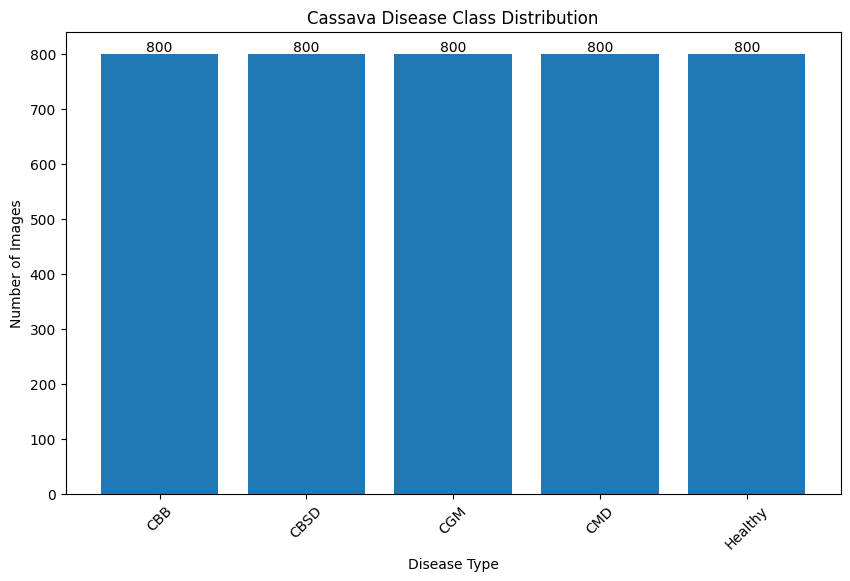

In [94]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [95]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [96]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    # Filter the DataFrame using the integer class_id
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    # Construct the image path directly using TRAIN_DIR and the image ID
    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

In [97]:
import os

print(f"Contents of TRAIN_DIR ({TRAIN_DIR}):")
# List only the first 10 items to avoid overwhelming output
contents = os.listdir(TRAIN_DIR)
if contents:
    for item in contents[:10]:
        print(item)
else:
    print("TRAIN_DIR is empty or does not exist.")

Contents of TRAIN_DIR (/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset/Train/Train_Images_clean):
3784315903.jpg
3863066565.jpg
3854923530.jpg
3826378692.jpg
3837192356.jpg
385812035.jpg
3852514218.jpg
3841961758.jpg
3813620418.jpg
379958464.jpg


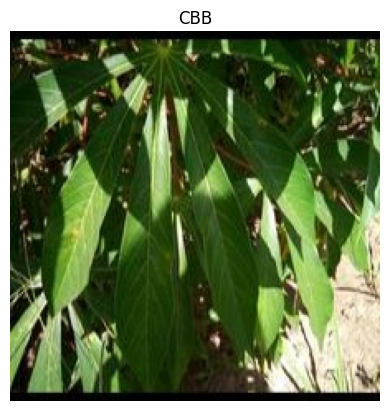

In [98]:
show_one_image(0)

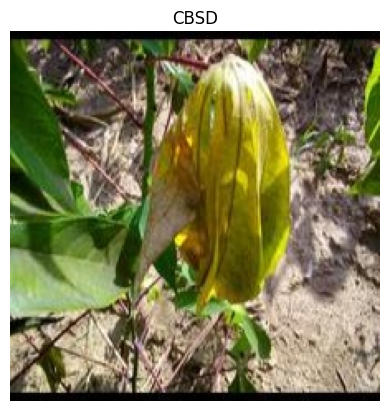

In [99]:
show_one_image(1)   # change class id

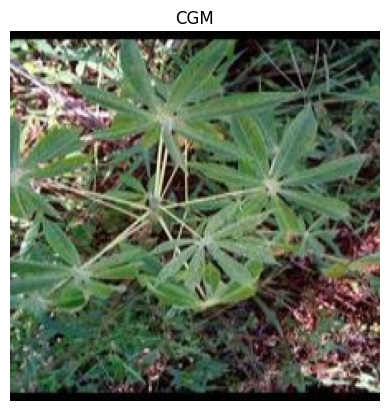

In [100]:
show_one_image(2)   # change class id

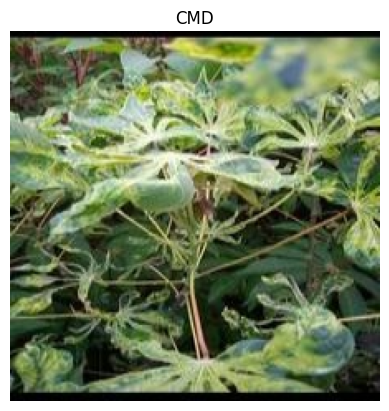

In [101]:
show_one_image(3)   # change class id

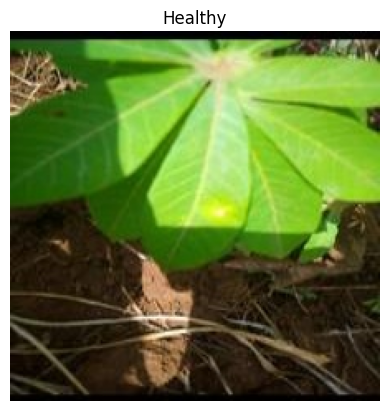

In [102]:
show_one_image(4)   # change class id

In [103]:
import cv2
import os

#Function to Access 3 random images from EACH class

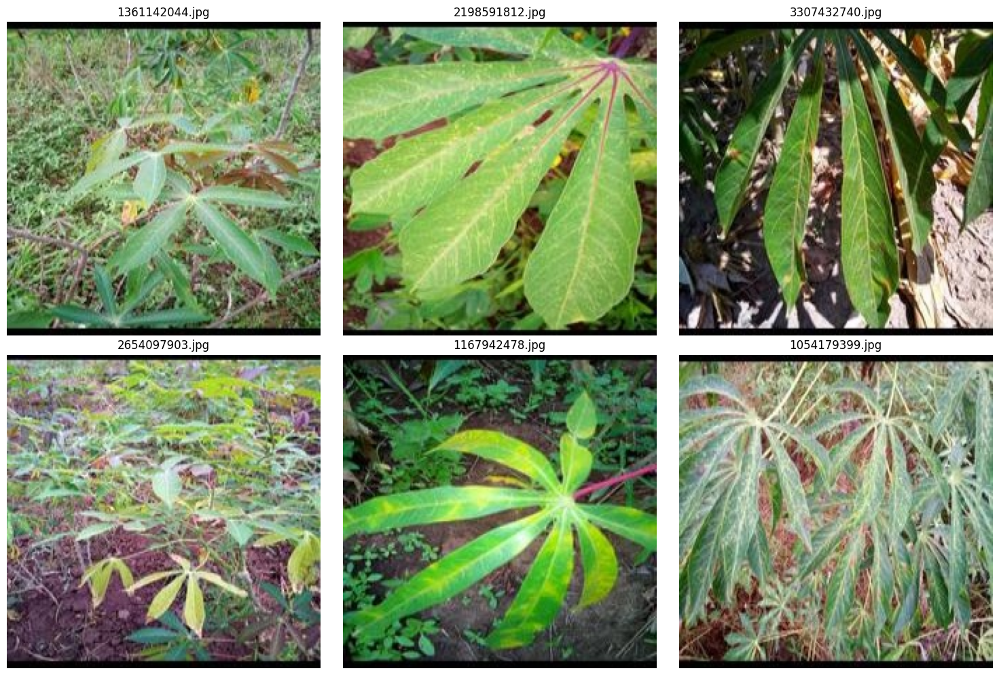

In [104]:
import matplotlib.pyplot as plt
import os
import cv2
import random

# Folder containing processed images
folder = TRAIN_DIR # Changed from "/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images_clean" to TRAIN_DIR

# Get image files
files = [f for f in os.listdir(folder)
         if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select 6 images
sample_files = random.sample(files, 6)

# Plot images
plt.figure(figsize=(15,10))

for i, file in enumerate(sample_files):

    img_path = os.path.join(folder, file)

    img = cv2.imread(img_path)

    # Convert BGR → RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(file)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image preprocessing

In [105]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

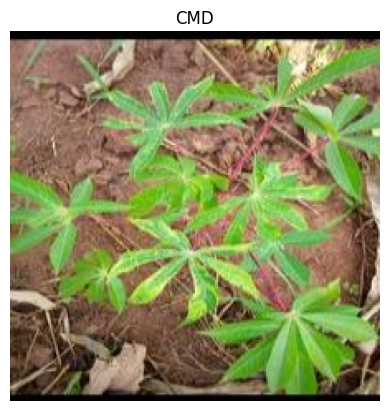

In [106]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

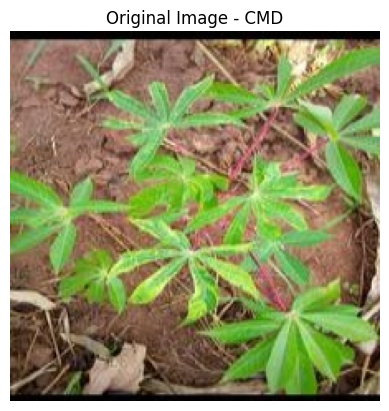

In [107]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [108]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

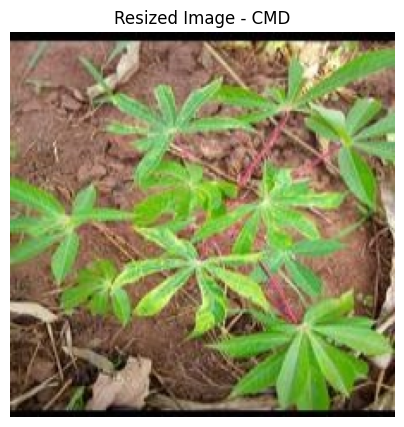

In [109]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

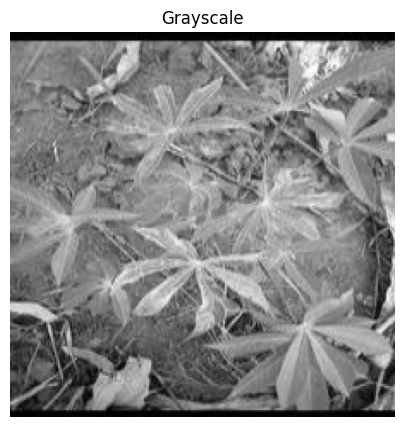

In [110]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

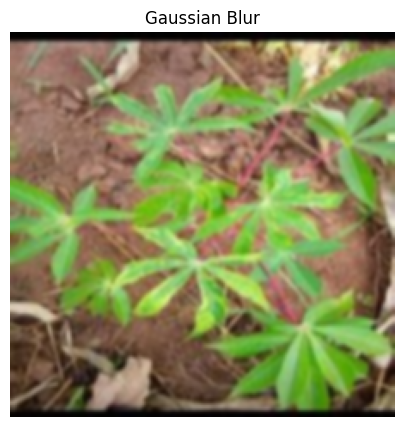

In [111]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

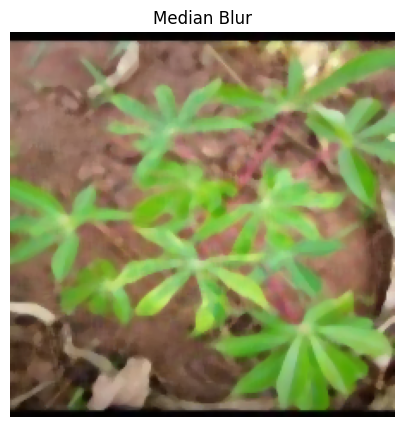

In [112]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

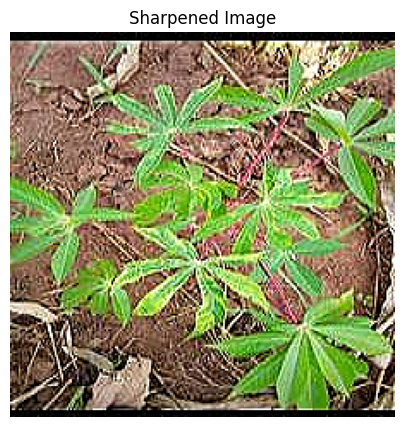

In [113]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

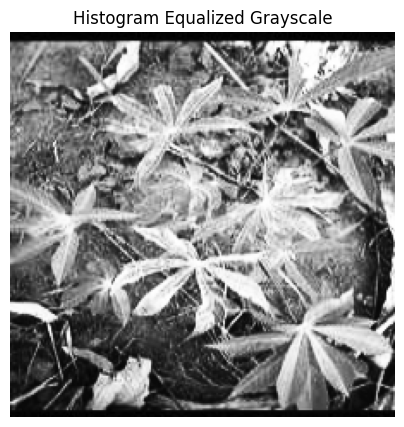

In [114]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

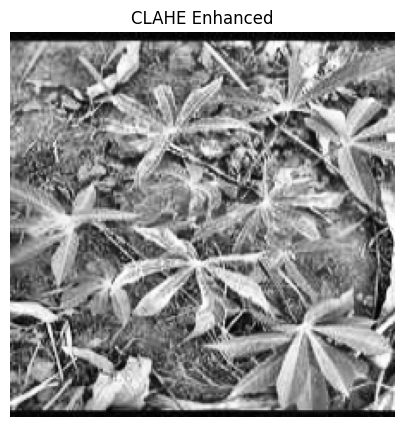

In [115]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

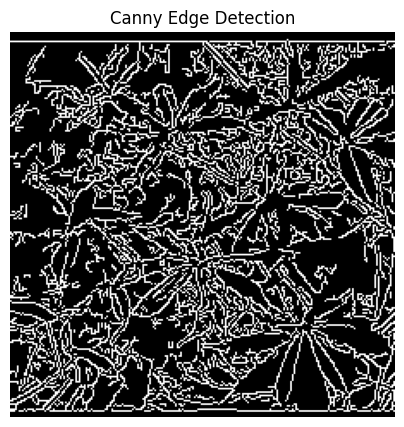

In [116]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

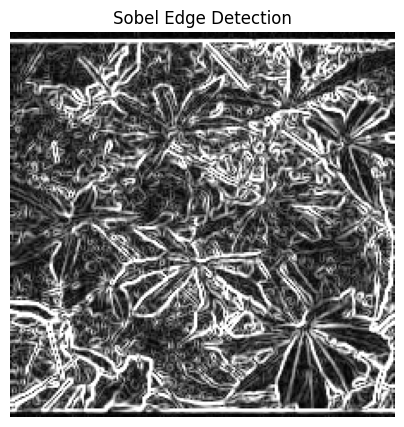

In [117]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

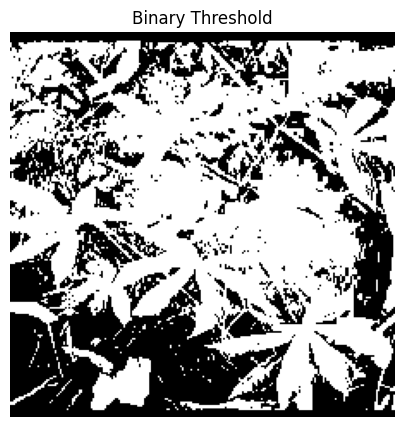

In [118]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

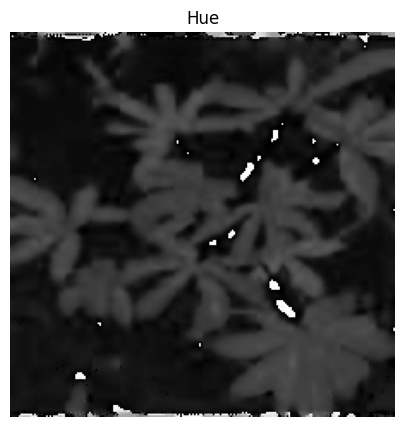

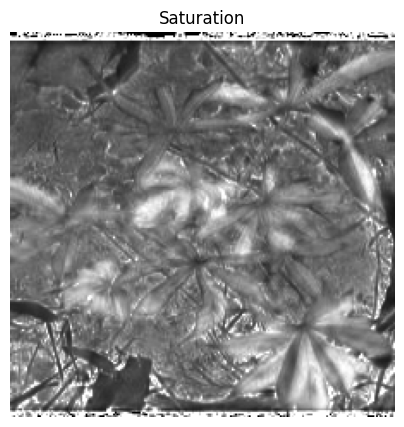

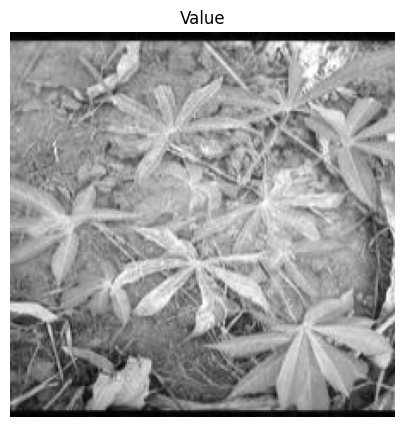

In [119]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

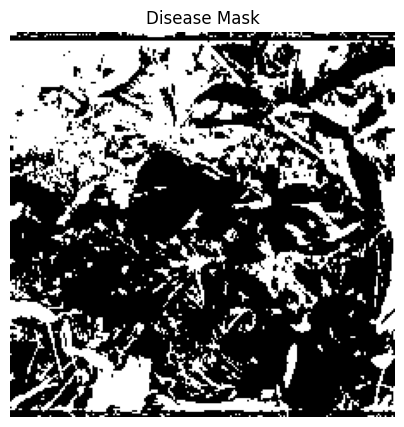

In [120]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

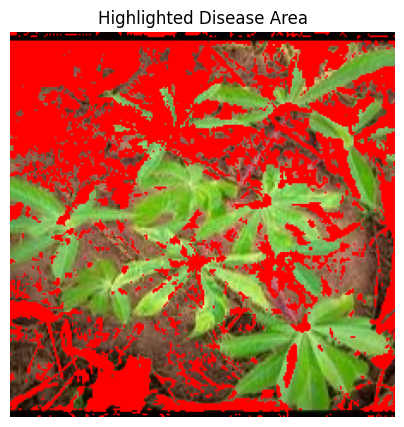

In [121]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

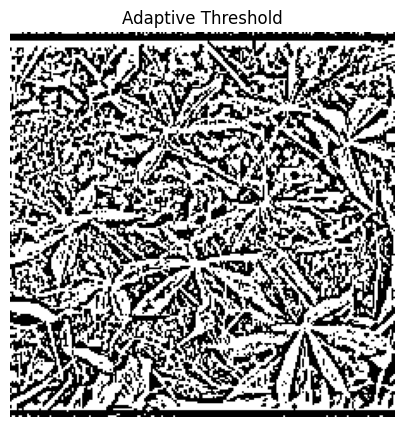

In [122]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

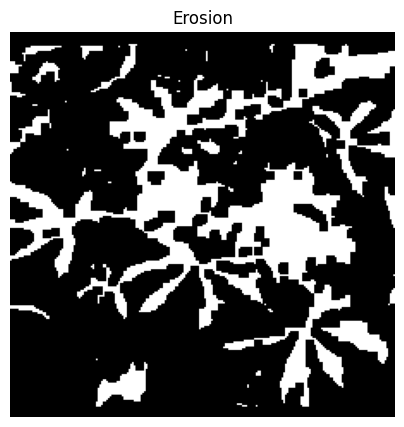

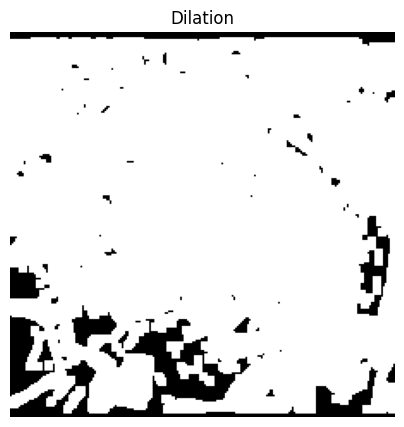

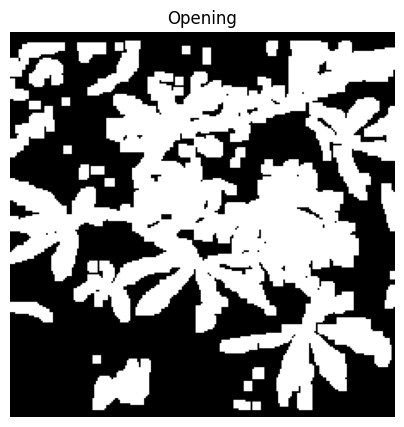

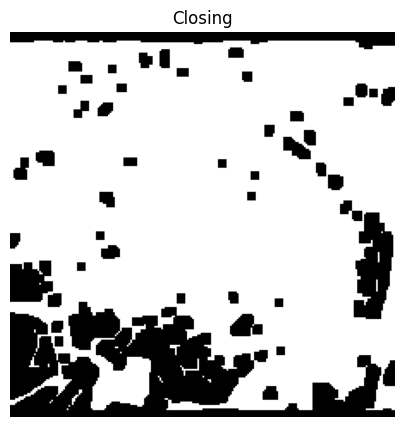

In [123]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

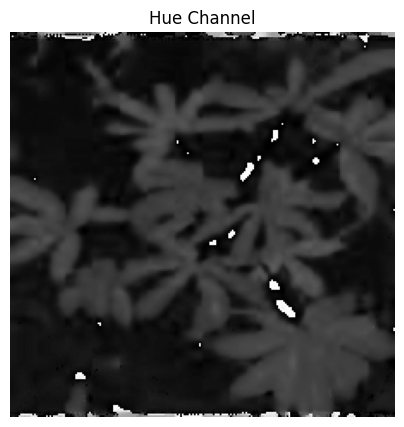

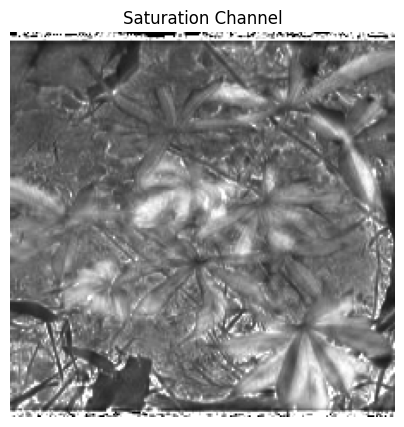

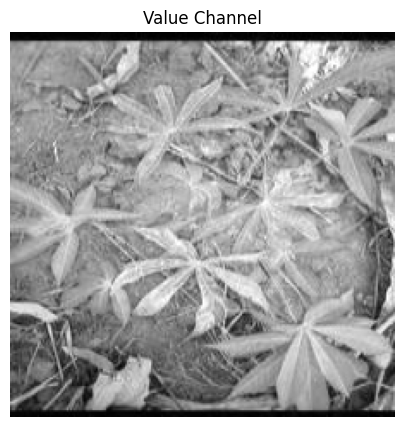

In [124]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

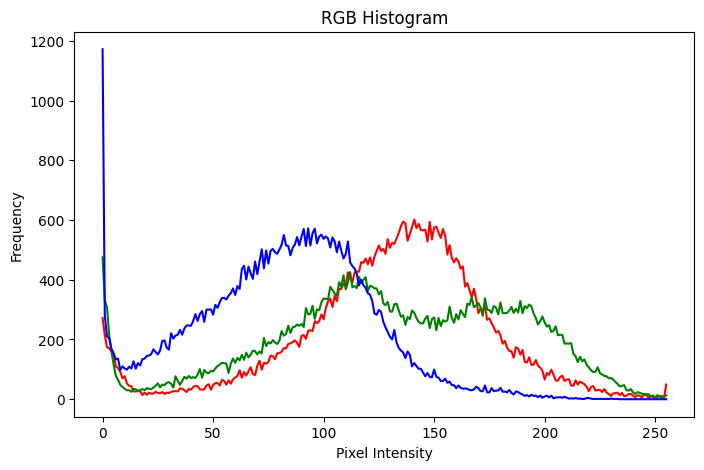

In [125]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

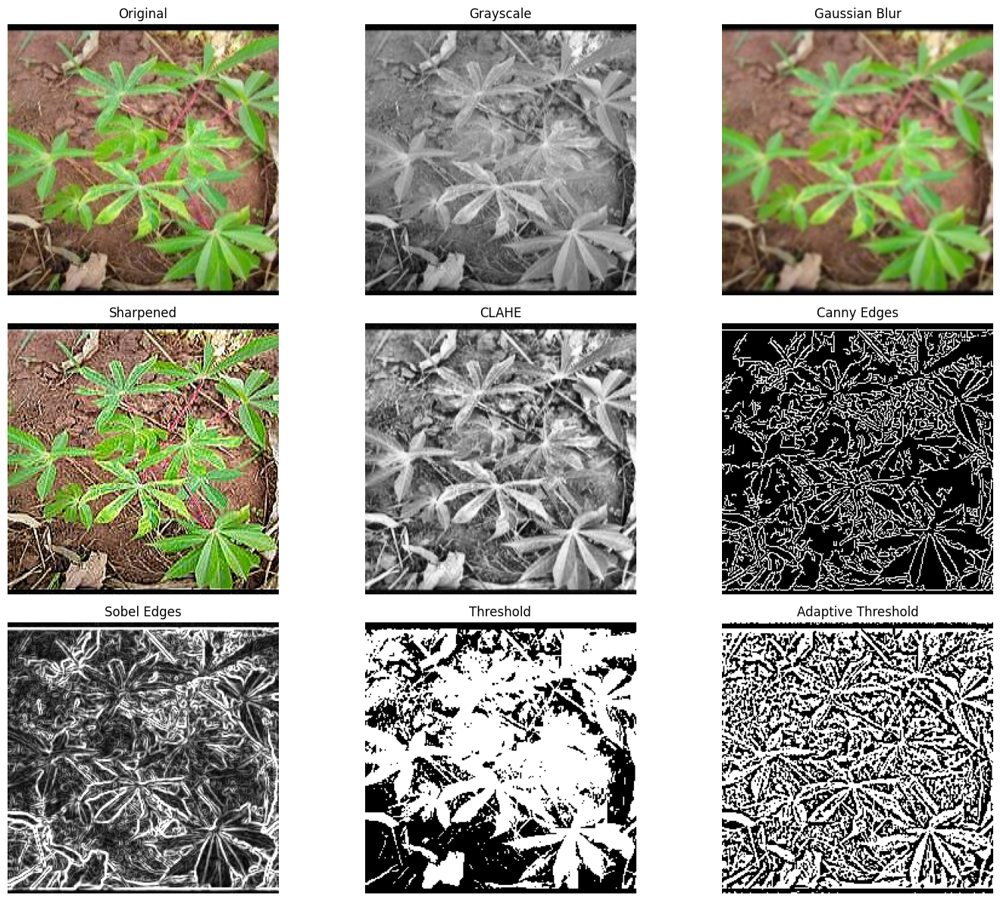

In [126]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

In [127]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model

from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator,
    load_img,
    img_to_array
)

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score
)

from sklearn.neighbors import KNeighborsClassifier

import matplotlib.pyplot as plt

from google.colab import drive

from tensorflow.keras.applications.efficientnet_v2 import (
    EfficientNetV2S,
    preprocess_input
)

import pandas as pd
import numpy as np
import seaborn as sns
import json
import os

dataset paths

In [128]:
MAIN_DATASET_PATH = (
    '/content/drive/MyDrive/main_dataset/dataset_sir/main_dataset'
)

TRAIN_CSV = (
    MAIN_DATASET_PATH + '/Train/Train.csv'
)

TRAIN_DIR = (
    MAIN_DATASET_PATH + '/Train/Train_Images_clean'
)

TEST_CSV = (
    MAIN_DATASET_PATH + '/Test/Test.csv'
)

TEST_DIR = (
    MAIN_DATASET_PATH + '/Test/Test_Images_clean'
)

LABEL_JSON = (
    MAIN_DATASET_PATH + '/label_num_to_disease_map.json'
)

check paths

In [129]:
print(os.path.exists(TRAIN_CSV))
print(os.path.exists(TEST_CSV))
print(os.path.exists(TRAIN_DIR))
print(os.path.exists(TEST_DIR))
print(os.path.exists(LABEL_JSON))

True
True
True
True
True


load

In [130]:
train_df = pd.read_csv(TRAIN_CSV)

test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

NUM_CLASSES = len(label_map)

print("Train Shape:", train_df.shape)
print("Test Shape :", test_df.shape)

Train Shape: (4000, 2)
Test Shape : (1000, 2)


train valid spilit

In [131]:
from sklearn.model_selection import train_test_split

train_df['Labels'] = train_df['Labels'].astype(str)
test_df['Labels'] = test_df['Labels'].astype(str)

train_data, valid_data = train_test_split(
    train_df,
    test_size=0.20,
    stratify=train_df['Labels'],
    random_state=42
)

In [132]:
epochs = 20

BATCH_SIZE = 32

IMG_SIZE = (224, 224)

In [133]:
train_data['image_path'] = (
    TRAIN_DIR + '/' + train_data['ID']
)

valid_data['image_path'] = (
    TRAIN_DIR + '/' + valid_data['ID']
)

test_df['image_path'] = (
    TEST_DIR + '/' + test_df['ID']
)

In [134]:
def extract_EfficientNetV2S_64_feature_map():

    base_model = EfficientNetV2S(
        input_shape=IMG_SIZE + (3,),
        include_top=False,
        weights='imagenet'
    )

    base_model.trainable = False

    inputs = keras.Input(shape=IMG_SIZE + (3,))

    x = preprocess_input(inputs)

    x = base_model(x, training=False)

    x = layers.GlobalAveragePooling2D()(x)

    feature_map = layers.Dense(
        64,
        activation='relu'
    )(x)

    model = keras.Model(inputs, feature_map)

    return model

In [135]:
def effnet_softmax_multiclass():

    base_model = EfficientNetV2S(
        input_shape=IMG_SIZE + (3,),
        include_top=False,
        weights='imagenet'
    )

    base_model.trainable = False

    inputs = keras.Input(shape=IMG_SIZE + (3,))

    x = preprocess_input(inputs)

    x = base_model(x, training=False)

    x = layers.GlobalAveragePooling2D()(x)

    feature_layer = layers.Dense(
        64,
        activation='relu',
        name='feature_extraction_layer'
    )(x)

    outputs = layers.Dense(
        NUM_CLASSES,
        activation='softmax'
    )(feature_layer)

    model = keras.Model(inputs, outputs)

    return model

In [136]:
def unfreeze_model(model):

    for layer in model.layers[-10:]:

        if not isinstance(
            layer,
            layers.BatchNormalization
        ):

            layer.trainable = True

In [137]:
def preprocess_image(image_path):

    img = load_img(
        image_path,
        target_size=(224, 224)
    )

    img_array = img_to_array(img)

    img_array = np.expand_dims(
        img_array,
        axis=0
    )

    return preprocess_input(img_array)

In [138]:
train_batches = ImageDataGenerator(
    preprocessing_function=preprocess_input
).flow_from_dataframe(
    dataframe=train_data,
    x_col='image_path',
    y_col='Labels',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

valid_batches = ImageDataGenerator(
    preprocessing_function=preprocess_input
).flow_from_dataframe(
    dataframe=valid_data,
    x_col='image_path',
    y_col='Labels',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_batches = ImageDataGenerator(
    preprocessing_function=preprocess_input
).flow_from_dataframe(
    dataframe=test_df,
    x_col='image_path',
    y_col='Labels',
    target_size=(224,224),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 3200 validated image filenames belonging to 5 classes.
Found 800 validated image filenames belonging to 5 classes.
Found 1000 validated image filenames belonging to 5 classes.


In [139]:
train_model = effnet_softmax_multiclass()

In [140]:
train_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-3
    ),

    loss='categorical_crossentropy',

    metrics=['accuracy']
)

In [141]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=3,
    min_lr=1e-5
)

In [142]:
history = train_model.fit(
    train_batches,
    epochs=epochs,
    validation_data=valid_batches,
    callbacks=[
        early_stopping,
        reduce_lr
    ],
    verbose=1
)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 80s 300ms/step - accuracy: 0.4881 - loss: 1.2425 - val_accuracy: 0.5450 - val_loss: 1.1309 - learning_rate: 0.0010
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 21s 207ms/step - accuracy: 0.5922 - loss: 1.0371 - val_accuracy: 0.5688 - val_loss: 1.0389 - learning_rate: 0.0010
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 182ms/step - accuracy: 0.6194 - loss: 0.9687 - val_accuracy: 0.6050 - val_loss: 1.0013 - learning_rate: 0.0010
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 187ms/step - accuracy: 0.6341 - loss: 0.9409 - val_accuracy: 0.6112 - val_loss: 0.9728 - learning_rate: 0.0010
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 19s 185ms/step - accuracy: 0.6562 - loss: 0.8956 - val_accuracy: 0.6075 - val_loss: 1.0113 - learning_rate: 0.0010
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 180ms/step - accuracy: 0.6644 - loss: 0.8653 - val_accuracy: 0.6075 - val_loss: 0.9937 - learning_rate: 0.0010
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 18s 180ms/step - accuracy: 0.6

In [143]:
train_model.save(
    '/content/drive/MyDrive/effnet_softmax_multiclass_tf_model.keras'
)

print(
    'TF Model saved after initial training'
)

TF Model saved after initial training


In [144]:
print('Unfreezing top layers...')

unfreeze_model(train_model)

train_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=1e-5
    ),

    loss='categorical_crossentropy',

    metrics=['accuracy']
)

Unfreezing top layers...


In [145]:
history_fine_tune = train_model.fit(
    train_batches,
    epochs=epochs,
    validation_data=valid_batches,
    callbacks=[
        early_stopping,
        reduce_lr
    ],
    verbose=1
)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 208s 514ms/step - accuracy: 0.3887 - loss: 1.4540 - val_accuracy: 0.4300 - val_loss: 1.3773 - learning_rate: 1.0000e-05
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 40s 396ms/step - accuracy: 0.4819 - loss: 1.2724 - val_accuracy: 0.4800 - val_loss: 1.2649 - learning_rate: 1.0000e-05
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 40s 396ms/step - accuracy: 0.5416 - loss: 1.1401 - val_accuracy: 0.5175 - val_loss: 1.2061 - learning_rate: 1.0000e-05


In [148]:
train_model.save(
    '/content/drive/MyDrive/fine_tuned_effnet_softmax_multiclass_tf_model.keras'
)

print(
    'Fine tuned TF model saved'
)

Fine tuned TF model saved


In [149]:
feature_extractor = keras.Model(
    inputs=train_model.inputs,
    outputs=train_model.get_layer(
        'feature_extraction_layer'
    ).output
)

In [150]:
X_train_features = feature_extractor.predict(
    train_batches
)

y_train_labels = train_batches.classes

X_test_features = feature_extractor.predict(
    test_batches
)

y_test_labels = test_batches.classes

print(
    'Shape of extracted training features:',
    X_train_features.shape
)

print(
    'Shape of extracted test features:',
    X_test_features.shape
)

100/100 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 764s 25s/step
Shape of extracted training features: (3200, 64)
Shape of extracted test features: (1000, 64)


In [151]:
knn = KNeighborsClassifier(
    n_neighbors=20
)

print('Training KNN classifier...')

knn.fit(
    X_train_features,
    y_train_labels
)

print('KNN classifier trained.')

Training KNN classifier...
KNN classifier trained.


In [152]:
print('Making predictions with KNN...')

y_pred = knn.predict(
    X_test_features
)

Making predictions with KNN...


In [153]:
accuracy = accuracy_score(
    y_test_labels,
    y_pred
)

print(
    f'KNN Accuracy: {accuracy:.4f}'
)

KNN Accuracy: 0.2100


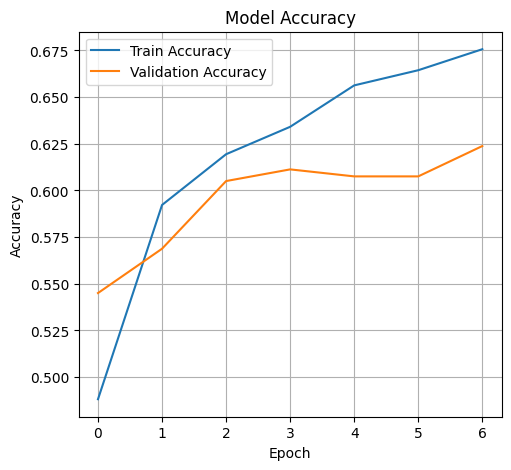

In [154]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)

plt.plot(
    history.history['accuracy'],
    label='Train Accuracy'
)

plt.plot(
    history.history['val_accuracy'],
    label='Validation Accuracy'
)

plt.title('Model Accuracy')

plt.xlabel('Epoch')

plt.ylabel('Accuracy')

plt.legend()

plt.grid(True)

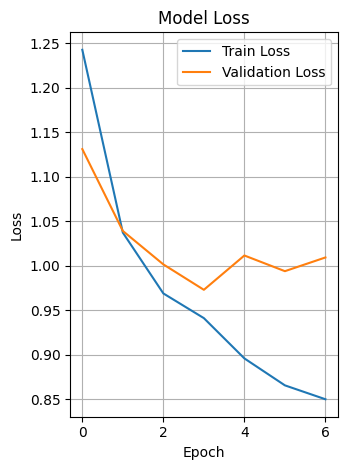

In [155]:
plt.subplot(1,2,2)

plt.plot(
    history.history['loss'],
    label='Train Loss'
)

plt.plot(
    history.history['val_loss'],
    label='Validation Loss'
)

plt.title('Model Loss')

plt.xlabel('Epoch')

plt.ylabel('Loss')

plt.legend()

plt.grid(True)

plt.tight_layout()

plt.show()

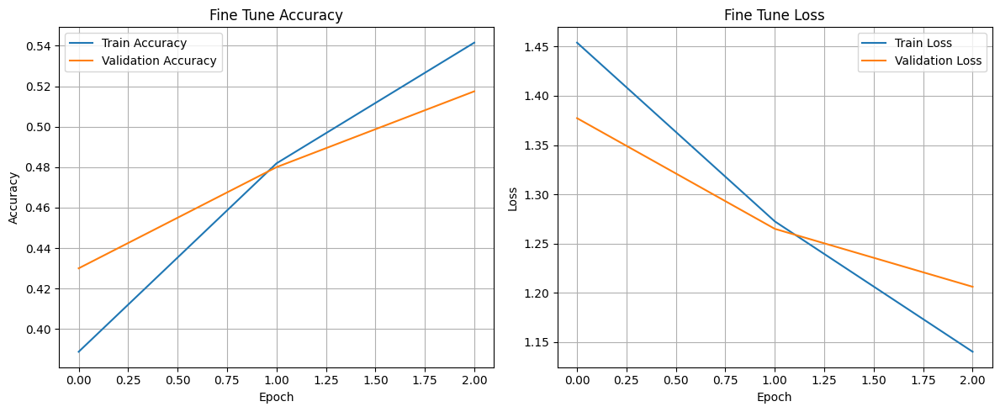

In [156]:
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)

plt.plot(
    history_fine_tune.history['accuracy'],
    label='Train Accuracy'
)

plt.plot(
    history_fine_tune.history['val_accuracy'],
    label='Validation Accuracy'
)

plt.title('Fine Tune Accuracy')

plt.xlabel('Epoch')

plt.ylabel('Accuracy')

plt.legend()

plt.grid(True)

# Loss
plt.subplot(1,2,2)

plt.plot(
    history_fine_tune.history['loss'],
    label='Train Loss'
)

plt.plot(
    history_fine_tune.history['val_loss'],
    label='Validation Loss'
)

plt.title('Fine Tune Loss')

plt.xlabel('Epoch')

plt.ylabel('Loss')

plt.legend()

plt.grid(True)

plt.tight_layout()

plt.show()

In [157]:
class_names = [
    label_map[str(i)]
    for i in range(NUM_CLASSES)
]

print(
    classification_report(
        y_test_labels,
        y_pred,
        target_names=class_names
    )
)

              precision    recall  f1-score   support

         CBB       0.16      0.21      0.18       200
        CBSD       0.26      0.33      0.29       200
         CGM       0.24      0.23      0.23       200
         CMD       0.20      0.17      0.18       200
     Healthy       0.19      0.12      0.14       200

    accuracy                           0.21      1000
   macro avg       0.21      0.21      0.21      1000
weighted avg       0.21      0.21      0.21      1000



Confusion Matrix:

[[42 55 38 37 28]
 [48 66 33 35 18]
 [56 35 46 30 33]
 [64 46 37 33 20]
 [52 55 41 29 23]]


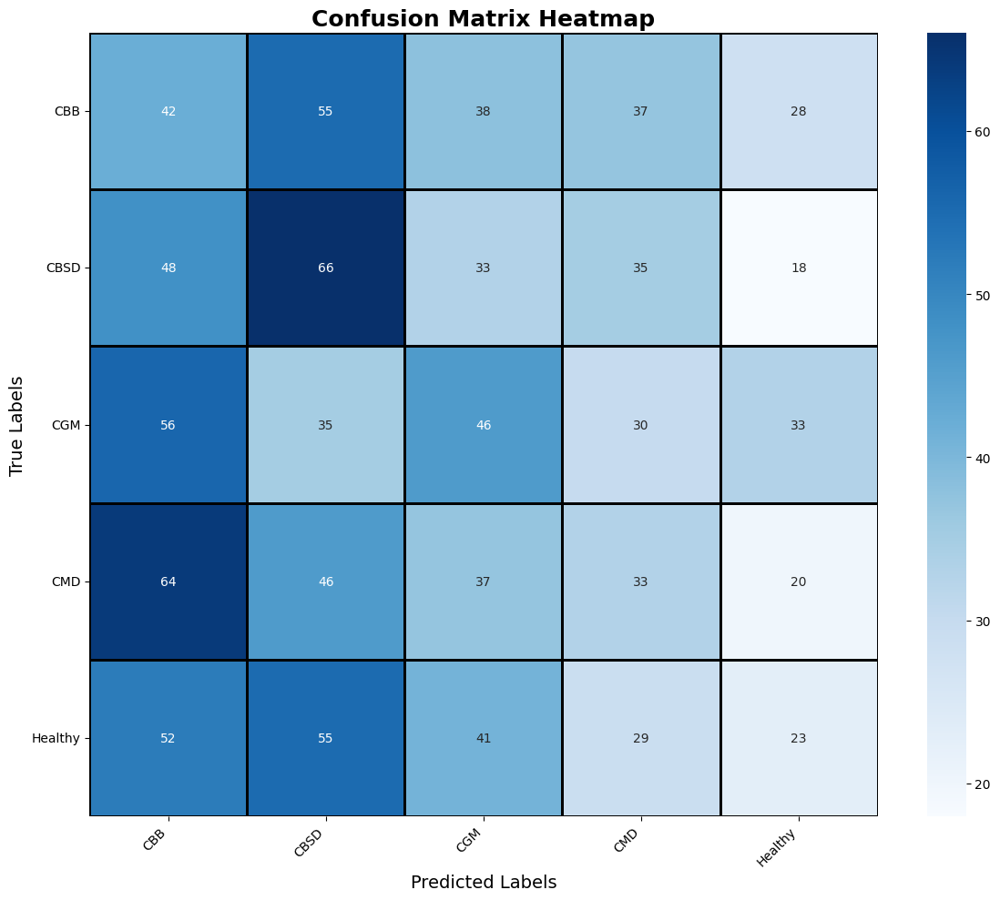

In [158]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# =========================================================
# CONFUSION MATRIX
# =========================================================

cm = confusion_matrix(
    y_test_labels,
    y_pred
)

print("Confusion Matrix:\n")
print(cm)

# =========================================================
# HEATMAP
# =========================================================

plt.figure(figsize=(12,10))

sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    linewidths=1,
    linecolor='black',
    xticklabels=class_names,
    yticklabels=class_names,
    cbar=True
)

plt.title(
    'Confusion Matrix Heatmap',
    fontsize=18,
    fontweight='bold'
)

plt.xlabel(
    'Predicted Labels',
    fontsize=14
)

plt.ylabel(
    'True Labels',
    fontsize=14
)

plt.xticks(
    rotation=45,
    ha='right'
)

plt.yticks(
    rotation=0
)

plt.tight_layout()

plt.show()